Importing Libraries

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Reading CSV file

In [ ]:
df_tel = pd.read_csv("/content/Telecom1.csv")

In [ ]:
df_tel.head()

,CustomerID,PlanTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


Information regarding Null and Data types of the features in our data.





In [ ]:
df_tel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              4888 non-null   int64  
 1   PlanTaken               4888 non-null   int64  
 2   Age                     4662 non-null   float64
 3   TypeofContact           4863 non-null   object 
 4   CityTier                4888 non-null   int64  
 5   DurationOfPitch         4637 non-null   float64
 6   Occupation              4888 non-null   object 
 7   Gender                  4888 non-null   object 
 8   NumberOfPersons         4888 non-null   int64  
 9   NumberOfFollowups       4843 non-null   float64
 10  PlanPitched             4888 non-null   object 
 11  PreferredServiceStar    4862 non-null   float64
 12  MaritalStatus           4888 non-null   object 
 13  NumberOfUpgrades        4748 non-null   float64
 14  iPhone                  4888 non-null   

Insights:
1. 14 Numerical Columns
2. 6 textual Columns - We have to perform onehot encoding/Panel Encoding for this type of data.

Describing Data

In [ ]:
df_tel.describe(include = 'all')

,CustomerID,PlanTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
count,4888.000000,4888.000000,4662.000000,4863,4888.000000,4637.000000,4888,4888,4888.000000,4843.000000,4888,4862.000000,4888,4748.000000,4888.000000,4888.000000,4888.000000,4822.000000,4888,4655.000000
unique,NaN,NaN,NaN,2,NaN,NaN,4,3,NaN,NaN,5,NaN,4,NaN,NaN,NaN,NaN,NaN,5,NaN
top,NaN,NaN,NaN,Self Enquiry,NaN,NaN,Salaried,Male,NaN,NaN,Basic,NaN,Married,NaN,NaN,NaN,NaN,NaN,Executive,NaN
freq,NaN,NaN,NaN,3444,NaN,NaN,2368,2916,NaN,NaN,1842,NaN,2340,NaN,NaN,NaN,NaN,NaN,1842,NaN
mean,202443.500000,0.188216,37.622265,NaN,1.654255,15.490835,NaN,NaN,2.905074,3.708445,NaN,3.581037,NaN,3.236521,0.290917,3.078151,0.620295,1.187267,NaN,23619.853491
std,1411.188388,0.390925,9.316387,NaN,0.916583,8.519643,NaN,NaN,0.724891,1.002509,NaN,0.798009,NaN,1.849019,0.454232,1.365792,0.485363,0.857861,NaN,5380.698361
min,200000.000000,0.000000,18.000000,NaN,1.000000,5.000000,NaN,NaN,1.000000,1.000000,NaN,3.000000,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,NaN,1000.000000
25%,201221.750000,0.000000,31.000000,NaN,1.000000,9.000000,NaN,NaN,2.000000,3.000000,NaN,3.000000,NaN,2.000000,0.000000,2.000000,0.000000,1.000000,NaN,20346.000000
50%,202443.500000,0.000000,36.000000,NaN,1.000000,13.000000,NaN,NaN,3.000000,4.000000,NaN,3.000000,NaN,3.000000,0.000000,3.000000,1.000000,1.000000,NaN,22347.000000
75%,203665.250000,0.000000,44.000000,NaN,3.000000,20.000000,NaN,NaN,3.000000,4.000000,NaN,4.000000,NaN,4.000000,1.000000,4.000000,1.000000,2.000000,NaN,25571.000000


Insights

Columns to look out outliers for
1. Duration of pitch
2. Number of Upgrades
3. Monthly Income ? 🤔

We have to remove customer id from dataframe because it will be irrelavant to target variable

In [ ]:
# Checking for duplicated Data points
dups = df_tel.duplicated().sum()
dups

0

*   We do not have any Duplicate values

<ipython-input-8-c02964b26bbc>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_tel.corr()


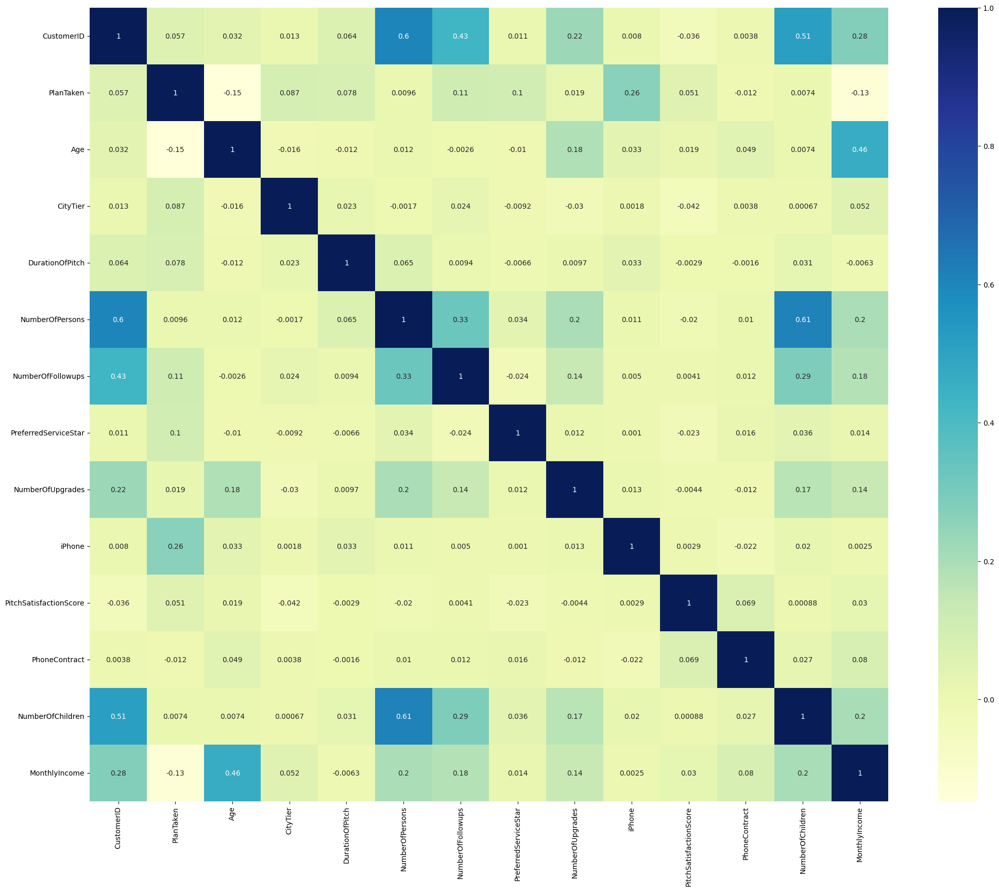

In [ ]:
plt.figure(figsize=(25, 20))
corr = df_tel.corr()
sns.heatmap(corr,annot=True,cmap='YlGnBu');
plt.show();

<ipython-input-9-7af99eda2725>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_tel.corr()[['PlanTaken']].sort_values(by='PlanTaken', ascending=False),annot=True, cmap='RdYlBu', linewidths=0.5)


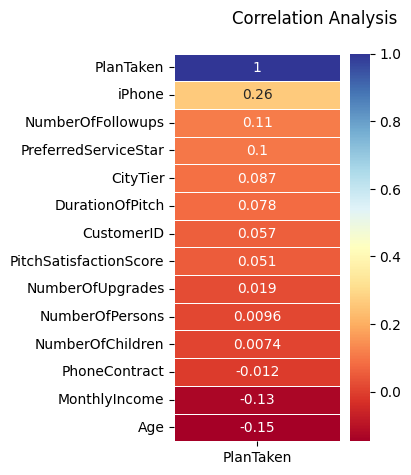

In [ ]:
plt.subplot(1,2,1)
sns.heatmap(df_tel.corr()[['PlanTaken']].sort_values(by='PlanTaken', ascending=False),annot=True, cmap='RdYlBu', linewidths=0.5)

plt.suptitle("Correlation Analysis")
plt.tight_layout()
plt.show()

The above plot shows us the the correlation of different features with "PlanTaken" and help us understand which features are important for us and which are not so important.

<Axes: ylabel='PlanTaken'>

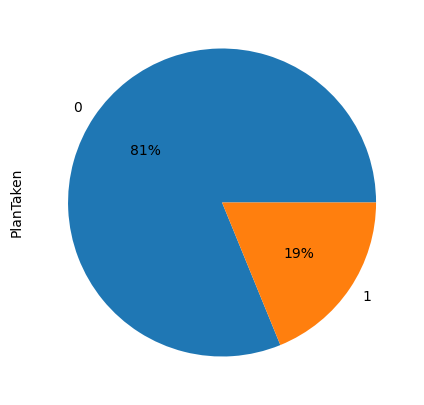

In [ ]:
plt.figure(figsize=(8,5))
df_tel['PlanTaken'].value_counts().plot(kind="pie",autopct='%1.0f%%')

In [ ]:
df_tel['PlanTaken'].value_counts()

0    3968
1     920
Name: PlanTaken, dtype: int64

## As we can see above we are facing class imbalance problem here .

*   We are going to Over sample our minority class to balance both the classes "0" and "1" so that our Model do better predictions.




In [ ]:
# Oversampling with random oversampler
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

y = df_tel['PlanTaken']
X = df_tel.drop('PlanTaken', axis=1)

ros = RandomOverSampler(random_state=0)
X_resampled,y_resampled= ros.fit_resample(X,y)
print(sorted(Counter(y_resampled).items()),y_resampled.shape)

[(0, 3968), (1, 3968)] (7936,)


# Model Building


*  Lets SPLIT the Data first.



In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_resampled,y_resampled, test_size=0.205, random_state=42)

# Why we took 20.5% as test set because as mentioned in the document we need atleast 1000 data points in the Test set

In [ ]:
print(X_train.shape)
print(X_test.shape)

(6309, 19)
(1627, 19)


In [ ]:
X_train.head()

,CustomerID,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
5307,201375,32.0,Company Invited,1,11.0,Salaried,Female,2,1.0,Basic,3.0,Single,4.0,1,1,0,1.0,Executive,17432.0
1195,201195,49.0,Self Enquiry,1,6.0,Salaried,Male,2,3.0,Super Deluxe,3.0,Single,5.0,0,3,1,0.0,AVP,30379.0
4010,204010,25.0,Self Enquiry,3,10.0,Salaried,Female,3,4.0,Deluxe,3.0,Married,2.0,0,4,0,1.0,Manager,23677.0
2921,202921,51.0,Company Invited,2,10.0,Small Business,Male,3,4.0,King,4.0,Divorced,NaN,0,2,1,1.0,VP,36878.0
604,200604,42.0,Self Enquiry,1,NaN,Salaried,Male,3,3.0,Deluxe,4.0,Divorced,2.0,0,3,1,1.0,Manager,NaN


#### Checking For Null values in Training set

In [ ]:
X_train.isna().sum()

CustomerID                  0
Age                       261
TypeofContact              31
CityTier                    0
DurationOfPitch           317
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups          53
PlanPitched                 0
PreferredServiceStar       34
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

### As the oversampling and Split is done we will now start fixing the Data.

Dropping the "Customer ID" (For Train set only)

In [ ]:
#Lets Drop the "Customer ID" it is of no use to the model .

X_train = X_train.drop(columns=['CustomerID'],axis=1)

In [ ]:
X_train.shape

(6309, 18)

Fixxing the "Gender" column by replacing "Fe Male" with "Female". (For Train Set only)

In [ ]:
# Fixing Values in the "Gender" feature
# replacing "Fe Male" with "Female"

import pandas as pd

X_train['Gender'] = X_train['Gender'].replace('Fe Male', 'Female')


Now we will impute the missing vales in the "Age" Feature. (For train set only)

In [ ]:
mean = X_train['Age'].mean()
print("Mean of Age is: ", mean)

Mean of Age is:  36.589120370370374


In [ ]:
X_train['Age'] = X_train['Age'].fillna(37)
X_train.isnull().sum()

Age                         0
TypeofContact              31
CityTier                    0
DurationOfPitch           317
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups          53
PlanPitched                 0
PreferredServiceStar       34
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64



*  In Age we have 0 missing values
*  Lets fix "TypeofContact" missing values we can replace them with Mode. (Train se only)



In [ ]:
mode = X_train['TypeofContact'].mode()
print("mode of TypeofContact is: ", mode)

mode of TypeofContact is:  0    Self Enquiry
Name: TypeofContact, dtype: object


In [ ]:
X_train['TypeofContact'] = X_train['TypeofContact'].fillna("Self Enquiry")
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch           317
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups          53
PlanPitched                 0
PreferredServiceStar       34
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

*  In TypeofContact we have 0 missing values
*  Lets fix "DurationOfPitch" missing values we can replace them with Mode. (Train se only)

In [ ]:
mean = X_train['DurationOfPitch'].mean()
print("Mean of DurationOfPitch is: ", mean)

Mean of DurationOfPitch is:  16.014519359145527


In [ ]:
X_train['DurationOfPitch'] = X_train['DurationOfPitch'].fillna(16)
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups          53
PlanPitched                 0
PreferredServiceStar       34
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

*  In DurationOfPitch we have 0 missing values
*  Lets fix "NumberOfFollowups" missing values we can replace them with Mode. (Train se only)

In [ ]:
mean = X_train['NumberOfFollowups'].mean()
print("Mean of NumberOfFollowups is: ", mean)

Mean of NumberOfFollowups is:  3.790281329923274


In [ ]:
X_train['NumberOfFollowups'] = X_train['NumberOfFollowups'].fillna(4)
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups           0
PlanPitched                 0
PreferredServiceStar       34
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

*  In NumberOfFollowups we have 0 missing values
*  Lets fix "PreferredServiceStar" missing values we can replace them with Mode. (Train se only)

In [ ]:
mean = X_train['PreferredServiceStar'].mean()
print("Mean of PreferredServiceStar is: ", mean)

Mean of PreferredServiceStar is:  3.6490836653386456


In [ ]:
X_train['PreferredServiceStar'] = X_train['PreferredServiceStar'].fillna(4)
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups           0
PlanPitched                 0
PreferredServiceStar        0
MaritalStatus               0
NumberOfUpgrades          135
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

*  In PreferredServiceStar we have 0 missing values
*  Lets fix "NumberOfUpgrades" missing values we can replace them with Mode. (Train se only)

In [ ]:
mode = X_train['NumberOfUpgrades'].mode()
print("Mode of NumberOfUpgrades is: ", mode)

Mode of NumberOfUpgrades is:  0    2.0
Name: NumberOfUpgrades, dtype: float64


In [ ]:
X_train['NumberOfUpgrades'] = X_train['NumberOfUpgrades'].fillna(2)
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups           0
PlanPitched                 0
PreferredServiceStar        0
MaritalStatus               0
NumberOfUpgrades            0
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           77
Designation                 0
MonthlyIncome             248
dtype: int64

*  In NumberOfUpgrades we have 0 missing values
*  Lets fix "NumberOfChildren" missing values we can replace them with Mode. (Train se only)

In [ ]:
mode = X_train['NumberOfChildren'].mode()
print("Mode of NumberOfChildren is: ", mode)

Mode of NumberOfChildren is:  0    1.0
Name: NumberOfChildren, dtype: float64


In [ ]:
X_train['NumberOfChildren'] = X_train['NumberOfChildren'].fillna(1)
X_train.isnull().sum()

Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups           0
PlanPitched                 0
PreferredServiceStar        0
MaritalStatus               0
NumberOfUpgrades            0
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren            0
Designation                 0
MonthlyIncome             248
dtype: int64

Last Feature left is Monthly income , it is highly correalted with it's related designation so we need to do it with accordance of a mean with related designation

In [ ]:
X_train.groupby('Designation')['MonthlyIncome'].describe()

,count,mean,std,min,25%,50%,75%,max
Designation,,,,,,,,
AVP,307.0,31932.185668,3120.250236,17705.0,30290.50,32099.0,34660.0,37502.0
Executive,2824.0,19998.846671,3475.483239,16009.0,17564.00,20582.0,21421.0,98678.0
Manager,1755.0,22795.193732,2865.689508,1000.0,20744.00,22964.0,24352.0,38525.0
Senior Manager,937.0,26320.501601,3044.266234,17372.0,24439.00,26124.0,28658.0,38395.0
VP,238.0,35738.079832,2852.055930,21195.0,34239.25,34934.5,37924.0,38677.0


In [ ]:
X_train['MonthlyIncome'] = X_train.groupby('Designation')['MonthlyIncome'].transform(lambda x: x.fillna(x.mean()))
# X_test['MonthlyIncome'] =  X_train.groupby('Designation')['MonthlyIncome'].transform(lambda x: x.fillna(x.mean()))

In [ ]:
median = X_train['MonthlyIncome'].median()
print("median of MonthlyIncome is: ", median)

median of MonthlyIncome is:  21673.0


In [ ]:
X_train.isnull().sum()

Age                       0
TypeofContact             0
CityTier                  0
DurationOfPitch           0
Occupation                0
Gender                    0
NumberOfPersons           0
NumberOfFollowups         0
PlanPitched               0
PreferredServiceStar      0
MaritalStatus             0
NumberOfUpgrades          0
iPhone                    0
PitchSatisfactionScore    0
PhoneContract             0
NumberOfChildren          0
Designation               0
MonthlyIncome             0
dtype: int64

### We are performing The split before missing value imputation to avoide Data leakage.

*   Same method is followed when we do One Hot encoding.



#### One - hot encoding for Textual data

In [ ]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

enc = OneHotEncoder()

#we are doing one hot encoding on - Designation, TypeofContact,Occupation, Gender, PlanPitched, MaritalStatus
train_features = enc.fit_transform(X_train[['TypeofContact', 'Occupation', 'Gender','PlanPitched','MaritalStatus','Designation']])

feature_names = enc.get_feature_names_out(['TypeofContact', 'Occupation', 'Gender','PlanPitched','MaritalStatus','Designation'])    #get proper naming

# Convert the sparse matrix to a DataFrame with proper column names
X_train_Encoded = pd.DataFrame(train_features.toarray(), columns=feature_names)


In [ ]:
#Resetting the index for values
X_train_new = X_train.reset_index(drop=False)
X_train_new2 = X_train_new.drop('index', axis=1)
X_train = X_train_new2
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6309 entries, 0 to 6308
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     6309 non-null   float64
 1   TypeofContact           6309 non-null   object 
 2   CityTier                6309 non-null   int64  
 3   DurationOfPitch         6309 non-null   float64
 4   Occupation              6309 non-null   object 
 5   Gender                  6309 non-null   object 
 6   NumberOfPersons         6309 non-null   int64  
 7   NumberOfFollowups       6309 non-null   float64
 8   PlanPitched             6309 non-null   object 
 9   PreferredServiceStar    6309 non-null   float64
 10  MaritalStatus           6309 non-null   object 
 11  NumberOfUpgrades        6309 non-null   float64
 12  iPhone                  6309 non-null   int64  
 13  PitchSatisfactionScore  6309 non-null   int64  
 14  PhoneContract           6309 non-null   

In [ ]:
X_test_new = X_test.reset_index(drop=False)
X_test_new2 = X_test_new.drop('index', axis=1)
X_test = X_test_new2
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1627 entries, 0 to 1626
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              1627 non-null   int64  
 1   Age                     1553 non-null   float64
 2   TypeofContact           1621 non-null   object 
 3   CityTier                1627 non-null   int64  
 4   DurationOfPitch         1556 non-null   float64
 5   Occupation              1627 non-null   object 
 6   Gender                  1627 non-null   object 
 7   NumberOfPersons         1627 non-null   int64  
 8   NumberOfFollowups       1607 non-null   float64
 9   PlanPitched             1627 non-null   object 
 10  PreferredServiceStar    1618 non-null   float64
 11  MaritalStatus           1627 non-null   object 
 12  NumberOfUpgrades        1584 non-null   float64
 13  iPhone                  1627 non-null   int64  
 14  PitchSatisfactionScore  1627 non-null   

In [ ]:
X_train_ohe = X_train.join(X_train_Encoded)
X_test_ohe = X_test.join(X_train_Encoded)

In [ ]:
# Removal of categorical columns
X_train_ohe_n = X_train_ohe.drop(columns = ['TypeofContact','Occupation','Gender','PlanPitched','MaritalStatus','Designation'],axis=1)
X_train_ohe = X_train_ohe_n
X_test_ohe_n = X_test_ohe.drop(columns = ['TypeofContact','Occupation','Gender','PlanPitched','MaritalStatus','Designation'],axis=1)
X_test_ohe = X_test_ohe_n

Analysis of target variable

In [ ]:
X_train_ohe.head()

,Age,CityTier,DurationOfPitch,NumberOfPersons,NumberOfFollowups,PreferredServiceStar,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,...,PlanPitched_Super Deluxe,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,Designation_AVP,Designation_Executive,Designation_Manager,Designation_Senior Manager,Designation_VP
0,32.0,1,11.0,2,1.0,3.0,4.0,1,1,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,49.0,1,6.0,2,3.0,3.0,5.0,0,3,1,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,25.0,3,10.0,3,4.0,3.0,2.0,0,4,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,51.0,2,10.0,3,4.0,4.0,2.0,0,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,42.0,1,16.0,3,3.0,4.0,2.0,0,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Lets do the outlier removal now

In [ ]:
X_train_ohe.describe()

,Age,CityTier,DurationOfPitch,NumberOfPersons,NumberOfFollowups,PreferredServiceStar,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,...,PlanPitched_Super Deluxe,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,Designation_AVP,Designation_Executive,Designation_Manager,Designation_Senior Manager,Designation_VP
count,6309.000000,6309.00000,6309.000000,6309.000000,6309.000000,6309.000000,6309.00000,6309.000000,6309.000000,6309.000000,...,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000
mean,36.606118,1.71184,16.013790,2.906800,3.792043,3.650975,3.22777,0.389127,3.112221,0.619750,...,0.048661,0.171184,0.425900,0.243145,0.159772,0.048661,0.465050,0.300048,0.148518,0.037724
std,9.537000,0.93428,8.397804,0.710372,1.004836,0.827883,1.90366,0.487591,1.356690,0.485487,...,0.215175,0.376700,0.494518,0.429016,0.366423,0.215175,0.498817,0.458315,0.355641,0.190543
min,18.000000,1.00000,5.000000,1.000000,1.000000,3.000000,1.00000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,1.00000,9.000000,2.000000,3.000000,3.000000,2.00000,0.000000,2.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,1.00000,14.000000,3.000000,4.000000,3.000000,3.00000,0.000000,3.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,42.000000,3.00000,21.000000,3.000000,4.000000,4.000000,4.00000,1.000000,4.000000,1.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,61.000000,3.00000,127.000000,5.000000,6.000000,5.000000,21.00000,1.000000,5.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


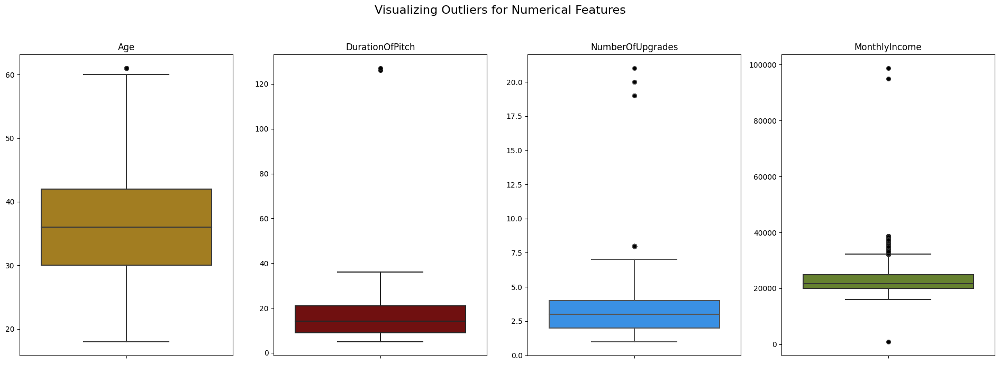

In [ ]:
fig, axs = plt.subplots(1,4,figsize=(19,7))
clmns = ['Age','DurationOfPitch', 'NumberOfUpgrades', 'MonthlyIncome']
colors = ['darkgoldenrod','maroon','dodgerblue','olivedrab']


for i,(column,color) in enumerate(zip(clmns,colors)):
    sns.boxplot(y = column ,data = X_train_ohe,ax = axs[i] ,color=color,flierprops=dict(markerfacecolor='black', marker='.', markersize=11))
    axs[i].set_title(column)
    axs[i].set(ylabel = None)

plt.suptitle('Visualizing Outliers for Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# Counting outliers
def count_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    print(f'Number of records with outliers in {column.name} :', X_train_ohe[(column < lower_limit) | (column > upper_limit)].shape[0])
count_outliers(X_train_ohe['Age'])
count_outliers(X_train_ohe['DurationOfPitch'])
count_outliers(X_train_ohe['NumberOfUpgrades'])
count_outliers(X_train_ohe['MonthlyIncome'])


Number of records with outliers in Age : 8
Number of records with outliers in DurationOfPitch : 2
Number of records with outliers in NumberOfUpgrades : 176
Number of records with outliers in MonthlyIncome : 462


In [ ]:
#new data set with outliers removed
X_train_ohe_outlier =  X_train_ohe

In [ ]:
def replace_outliers_with_limits(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    column = column.apply(lambda x: upper_limit if x > upper_limit else lower_limit if x < lower_limit else x)
    return column


# Replace outliers with upper and lower limits
X_train_ohe_outlier['Age'] = replace_outliers_with_limits(X_train_ohe['Age'])
X_train_ohe_outlier['DurationOfPitch'] = replace_outliers_with_limits(X_train_ohe['DurationOfPitch'])
X_train_ohe_outlier['NumberOfUpgrades'] = replace_outliers_with_limits(X_train_ohe['NumberOfUpgrades'])
X_train_ohe_outlier['MonthlyIncome'] = replace_outliers_with_limits(X_train_ohe['MonthlyIncome'])

print('After Handling the outliers -->\n')
count_outliers(X_train_ohe_outlier['Age'])
count_outliers(X_train_ohe_outlier['DurationOfPitch'])
count_outliers(X_train_ohe_outlier['NumberOfUpgrades'])
count_outliers(X_train_ohe_outlier['MonthlyIncome'])


After Handling the outliers -->

Number of records with outliers in Age : 0
Number of records with outliers in DurationOfPitch : 0
Number of records with outliers in NumberOfUpgrades : 0
Number of records with outliers in MonthlyIncome : 0


# Our Training set is ready to train the Model now we just need to repeat all these steps for the Testing set.

In [ ]:
X_test.head()

,CustomerID,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
0,201704,33.0,Self Enquiry,1,20.0,Small Business,Male,2,3.0,Basic,3.0,Married,6.0,1,1,1,1.0,Executive,17436.0
1,204833,60.0,Company Invited,1,21.0,Salaried,Female,3,4.0,Standard,3.0,Single,2.0,1,5,1,1.0,Senior Manager,29190.0
2,203450,50.0,Company Invited,1,35.0,Salaried,Male,4,5.0,Deluxe,5.0,Unmarried,5.0,0,3,0,2.0,Manager,22962.0
3,203554,36.0,Self Enquiry,1,9.0,Salaried,Female,4,4.0,Basic,5.0,Married,3.0,1,1,1,2.0,Executive,20752.0
4,201669,38.0,Self Enquiry,1,35.0,Large Business,Male,2,3.0,Deluxe,3.0,Married,4.0,0,1,0,0.0,Manager,21261.0


In [ ]:
X_test.isnull().sum()

CustomerID                 0
Age                       74
TypeofContact              6
CityTier                   0
DurationOfPitch           71
Occupation                 0
Gender                     0
NumberOfPersons            0
NumberOfFollowups         20
PlanPitched                0
PreferredServiceStar       9
MaritalStatus              0
NumberOfUpgrades          43
iPhone                     0
PitchSatisfactionScore     0
PhoneContract              0
NumberOfChildren          21
Designation                0
MonthlyIncome             66
dtype: int64

## Lets fix all the missing values in the Testing set using the same techniques as implemented in the Training Set.

In [ ]:
#Lets Drop the "Customer ID" it is of no use to the model .

X_test = X_test.drop(columns=['CustomerID'],axis=1)

In [ ]:
# Fixing Values in the "Gender" feature
# replacing "Fe Male" with "Female"

import pandas as pd

X_test['Gender'] = X_test['Gender'].replace('Fe Male', 'Female')

**Imputing missing values for "Age"**

In [ ]:
mean = X_test['Age'].mean()
print("Mean of Age is: ", mean)

Mean of Age is:  36.50354153251771


In [ ]:
X_test['Age'] = X_test['Age'].fillna(37)
X_test.isnull().sum()

Age                        0
TypeofContact              6
CityTier                   0
DurationOfPitch           71
Occupation                 0
Gender                     0
NumberOfPersons            0
NumberOfFollowups         20
PlanPitched                0
PreferredServiceStar       9
MaritalStatus              0
NumberOfUpgrades          43
iPhone                     0
PitchSatisfactionScore     0
PhoneContract              0
NumberOfChildren          21
Designation                0
MonthlyIncome             66
dtype: int64

**Imputing missing values for "TypeofContact"**

In [ ]:
mode = X_test['TypeofContact'].mode()
print("mode of TypeofContact is: ", mode)

mode of TypeofContact is:  0    Self Enquiry
Name: TypeofContact, dtype: object


In [ ]:
X_test['TypeofContact'] = X_test['TypeofContact'].fillna("Self Enquiry")
X_test.isnull().sum()

Age                        0
TypeofContact              0
CityTier                   0
DurationOfPitch           71
Occupation                 0
Gender                     0
NumberOfPersons            0
NumberOfFollowups         20
PlanPitched                0
PreferredServiceStar       9
MaritalStatus              0
NumberOfUpgrades          43
iPhone                     0
PitchSatisfactionScore     0
PhoneContract              0
NumberOfChildren          21
Designation                0
MonthlyIncome             66
dtype: int64

In [ ]:
mean = X_test['DurationOfPitch'].mean()
print("Mean of DurationOfPitch is: ", mean)

Mean of DurationOfPitch is:  16.034061696658096


In [ ]:
X_test['DurationOfPitch'] = X_test['DurationOfPitch'].fillna(16)

In [ ]:
mean = X_test['NumberOfFollowups'].mean()
print("Mean of NumberOfFollowups is: ", mean)

Mean of NumberOfFollowups is:  3.7778469197261977


In [ ]:
X_test['NumberOfFollowups'] = X_test['NumberOfFollowups'].fillna(4)
X_test.isnull().sum()

Age                        0
TypeofContact              0
CityTier                   0
DurationOfPitch            0
Occupation                 0
Gender                     0
NumberOfPersons            0
NumberOfFollowups          0
PlanPitched                0
PreferredServiceStar       9
MaritalStatus              0
NumberOfUpgrades          43
iPhone                     0
PitchSatisfactionScore     0
PhoneContract              0
NumberOfChildren          21
Designation                0
MonthlyIncome             66
dtype: int64

In [ ]:
mean = X_test['PreferredServiceStar'].mean()
print("Mean of PreferredServiceStar is: ", mean)

Mean of PreferredServiceStar is:  3.623609394313968


In [ ]:
X_test['PreferredServiceStar'] = X_test['PreferredServiceStar'].fillna(4)

In [ ]:
mode = X_test['NumberOfUpgrades'].mode()
print("Mode of NumberOfUpgrades is: ", mode)

Mode of NumberOfUpgrades is:  0    2.0
Name: NumberOfUpgrades, dtype: float64


In [ ]:
X_test['NumberOfUpgrades'] = X_test['NumberOfUpgrades'].fillna(2)

In [ ]:
mode = X_test['NumberOfChildren'].mode()
print("Mode of NumberOfChildren is: ", mode)

Mode of NumberOfChildren is:  0    1.0
Name: NumberOfChildren, dtype: float64


In [ ]:
X_test['NumberOfChildren'] = X_test['NumberOfChildren'].fillna(1)

In [ ]:
median = X_test['MonthlyIncome'].median()
print("median of MonthlyIncome is: ", median)

median of MonthlyIncome is:  21553.0


In [ ]:
# X_test['MonthlyIncome'] = X_test['MonthlyIncome'].fillna(21553)
X_test['MonthlyIncome'] =  X_train.groupby('Designation')['MonthlyIncome'].transform(lambda x: x.fillna(x.mean()))
X_test.isnull().sum()

Age                       0
TypeofContact             0
CityTier                  0
DurationOfPitch           0
Occupation                0
Gender                    0
NumberOfPersons           0
NumberOfFollowups         0
PlanPitched               0
PreferredServiceStar      0
MaritalStatus             0
NumberOfUpgrades          0
iPhone                    0
PitchSatisfactionScore    0
PhoneContract             0
NumberOfChildren          0
Designation               0
MonthlyIncome             0
dtype: int64

### As we see here, there are no missing values in out Test set , so moving forward we will be doing One hot encoding as we did on the Training set.

## ***But here we are only going to Transform NOT fit***

In [ ]:
test_features = enc.transform(X_test[['TypeofContact', 'Occupation', 'Gender','PlanPitched','MaritalStatus','Designation']])

# feature names after one-hot encoding
feature_names = enc.get_feature_names_out(['TypeofContact', 'Occupation', 'Gender','PlanPitched','MaritalStatus','Designation'])
X_test_Encoded = pd.DataFrame(test_features.toarray(), columns=feature_names)

In [ ]:

# Testing data
X_test_ohe = X_test.drop(columns=['TypeofContact', 'Occupation', 'Gender','PlanPitched','MaritalStatus','Designation'],axis=1)
X_test_ohe = X_test_ohe.join(X_test_Encoded)


### **After doing One Hot encoding Next step is to remove outliers for the Test Set**

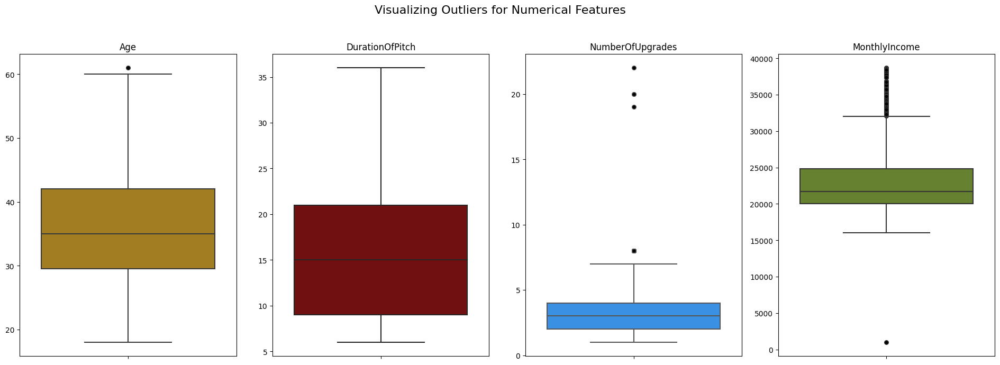

In [ ]:
fig, axs = plt.subplots(1,4,figsize=(19,7))
clmns = ['Age','DurationOfPitch', 'NumberOfUpgrades', 'MonthlyIncome']
colors = ['darkgoldenrod','maroon','dodgerblue','olivedrab']


for i,(column,color) in enumerate(zip(clmns,colors)):
    sns.boxplot(y = column ,data = X_test_ohe,ax = axs[i] ,color=color,flierprops=dict(markerfacecolor='black', marker='.', markersize=11))
    axs[i].set_title(column)
    axs[i].set(ylabel = None)

plt.suptitle('Visualizing Outliers for Numerical Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

The Above plot shows us hot the values are distributed in terms of the range.

In [ ]:
# Counting outliers for Test Set
def count_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    print(f'Number of records with outliers in {column.name} :', X_test_ohe[(column < lower_limit) | (column > upper_limit)].shape[0])
count_outliers(X_test_ohe['Age'])
count_outliers(X_test_ohe['DurationOfPitch'])
count_outliers(X_test_ohe['NumberOfUpgrades'])
count_outliers(X_test_ohe['MonthlyIncome'])


Number of records with outliers in Age : 1
Number of records with outliers in DurationOfPitch : 0
Number of records with outliers in NumberOfUpgrades : 44
Number of records with outliers in MonthlyIncome : 128


In [ ]:
#new data set with outliers removed
X_test_ohe_outlier =  X_test_ohe

In [ ]:
def replace_outliers_with_limits(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    column = column.apply(lambda x: upper_limit if x > upper_limit else lower_limit if x < lower_limit else x)
    return column


# Replace outliers with upper and lower limits
X_test_ohe_outlier['Age'] = replace_outliers_with_limits(X_test_ohe['Age'])
X_test_ohe_outlier['DurationOfPitch'] = replace_outliers_with_limits(X_test_ohe['DurationOfPitch'])
X_test_ohe_outlier['NumberOfUpgrades'] = replace_outliers_with_limits(X_test_ohe['NumberOfUpgrades'])
X_test_ohe_outlier['MonthlyIncome'] = replace_outliers_with_limits(X_test_ohe['MonthlyIncome'])

print('After Handling the outliers -->\n')
count_outliers(X_test_ohe_outlier['Age'])
count_outliers(X_test_ohe_outlier['DurationOfPitch'])
count_outliers(X_test_ohe_outlier['NumberOfUpgrades'])
count_outliers(X_test_ohe_outlier['MonthlyIncome'])


After Handling the outliers -->

Number of records with outliers in Age : 0
Number of records with outliers in DurationOfPitch : 0
Number of records with outliers in NumberOfUpgrades : 0
Number of records with outliers in MonthlyIncome : 0


### Here is our final Test Dataset after doing all the Data cleaning
#### Lets have a look at our data now

In [ ]:
X_test_ohe_outlier

,Age,CityTier,DurationOfPitch,NumberOfPersons,NumberOfFollowups,PreferredServiceStar,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,...,PlanPitched_Super Deluxe,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,Designation_AVP,Designation_Executive,Designation_Manager,Designation_Senior Manager,Designation_VP
0,33.0,1,20.0,2,3.0,3.0,6.0,1,1,1,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,60.0,1,21.0,3,4.0,3.0,2.0,1,5,1,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,50.0,1,35.0,4,5.0,5.0,5.0,0,3,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,36.0,1,9.0,4,4.0,5.0,3.0,1,1,1,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,38.0,1,35.0,2,3.0,3.0,4.0,0,1,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1622,33.0,1,31.0,2,4.0,4.0,5.0,1,4,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1623,25.0,1,15.0,2,3.0,5.0,4.0,0,1,1,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1624,25.0,1,18.0,4,3.0,3.0,2.0,0,3,1,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1625,31.0,3,16.0,3,4.0,3.0,3.0,0,5,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


## Modelling Iteration 1.

In [ ]:
X_train_ohe_outlier.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6309 entries, 0 to 6308
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            6309 non-null   float64
 1   CityTier                       6309 non-null   int64  
 2   DurationOfPitch                6309 non-null   float64
 3   NumberOfPersons                6309 non-null   int64  
 4   NumberOfFollowups              6309 non-null   float64
 5   PreferredServiceStar           6309 non-null   float64
 6   NumberOfUpgrades               6309 non-null   float64
 7   iPhone                         6309 non-null   int64  
 8   PitchSatisfactionScore         6309 non-null   int64  
 9   PhoneContract                  6309 non-null   int64  
 10  NumberOfChildren               6309 non-null   float64
 11  MonthlyIncome                  6309 non-null   float64
 12  TypeofContact_Company Invited  6309 non-null   f

In [ ]:
X_train_ohe_outlier.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6309 entries, 0 to 6308
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            6309 non-null   float64
 1   CityTier                       6309 non-null   int64  
 2   DurationOfPitch                6309 non-null   float64
 3   NumberOfPersons                6309 non-null   int64  
 4   NumberOfFollowups              6309 non-null   float64
 5   PreferredServiceStar           6309 non-null   float64
 6   NumberOfUpgrades               6309 non-null   float64
 7   iPhone                         6309 non-null   int64  
 8   PitchSatisfactionScore         6309 non-null   int64  
 9   PhoneContract                  6309 non-null   int64  
 10  NumberOfChildren               6309 non-null   float64
 11  MonthlyIncome                  6309 non-null   float64
 12  TypeofContact_Company Invited  6309 non-null   f

In [ ]:
X_test_ohe_outlier.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1627 entries, 0 to 1626
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            1627 non-null   float64
 1   CityTier                       1627 non-null   int64  
 2   DurationOfPitch                1627 non-null   float64
 3   NumberOfPersons                1627 non-null   int64  
 4   NumberOfFollowups              1627 non-null   float64
 5   PreferredServiceStar           1627 non-null   float64
 6   NumberOfUpgrades               1627 non-null   float64
 7   iPhone                         1627 non-null   int64  
 8   PitchSatisfactionScore         1627 non-null   int64  
 9   PhoneContract                  1627 non-null   int64  
 10  NumberOfChildren               1627 non-null   float64
 11  MonthlyIncome                  1627 non-null   float64
 12  TypeofContact_Company Invited  1627 non-null   f

Accuracy: 0.7123540258143823
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.71      0.71       830
           1       0.70      0.72      0.71       797

    accuracy                           0.71      1627
   macro avg       0.71      0.71      0.71      1627
weighted avg       0.71      0.71      0.71      1627



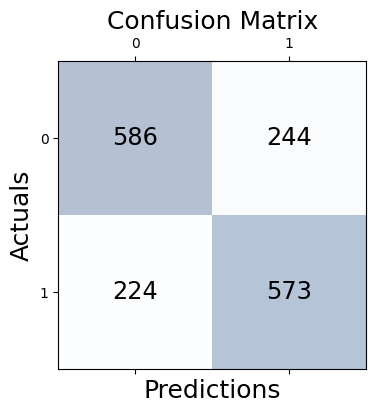

In [ ]:
# As we already did thee split in the starting , we can skip that step and directly do the model fitting

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score,roc_curve

model = LogisticRegression(solver='liblinear', max_iter=3000)
model.fit(X_train_ohe_outlier, y_train)
predictions = model.predict(X_test_ohe_outlier)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print('Accuracy:', accuracy)

# includes precision, recall, f1-score, and support
print('Classification Report:\n', classification_report(y_test, predictions))
train_predictions = model.predict(X_train_ohe_outlier)
test_predictions = model.predict(X_test_ohe_outlier)

conf_matrix = confusion_matrix(y_true=y_test, y_pred=test_predictions)
fig, ax = plt.subplots(figsize=(4, 4))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

ROC and AUC Curve

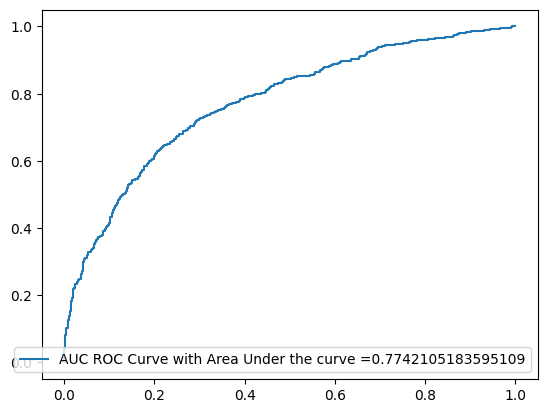

In [ ]:
from sklearn.metrics import roc_auc_score,roc_curve
y_pred_proba = model.predict_proba (X_test_ohe_outlier) [:, 1]
fpr, tpr, thresholds = roc_curve (y_test, y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="AUC ROC Curve with Area Under the curve ="+str(auc))
plt.legend (loc=4)
plt.show()

## We got 77% Confidence in the first iteration

In [ ]:
print("Logistic Regression train performance = ", accuracy_score(y_train,model.predict(X_train_ohe_outlier)))
print("Logistic Regression train performance = ", accuracy_score(y_test,model.predict(X_test_ohe_outlier)))

Logistic Regression train performance =  0.7387858614677445
Logistic Regression train performance =  0.7123540258143823


## Sensitivity Analysis

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, test_predictions)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate sensitivity (true positive rate)
sensitivity = conf_matrix[1, 1] / (conf_matrix[1, 0] + conf_matrix[1, 1])
print(f"Sensitivity (True Positive Rate): {sensitivity}")

Confusion Matrix:
[[586 244]
 [224 573]]
Sensitivity (True Positive Rate): 0.7189460476787954


SGD

In [ ]:
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Create a gradient descent regressor with standard scaling
sgd_regressor = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3))

# Fit the model
sgd_regressor.fit(X_train_ohe_outlier, y_train)

# Print the coefficients and intercept
coef = sgd_regressor[1].coef_
intercept = sgd_regressor[1].intercept_
coef, intercept

(array([-0.00461304,  0.0860678 ,  0.04659467,  0.00274834,  0.06660179,
         0.04458981,  0.02708517,  0.13769703,  0.02871366,  0.01365157,
        -0.01999489, -0.03613849,  0.01061373, -0.01061373,  0.00120782,
         0.03209863, -0.00217238, -0.0179417 , -0.0141033 ,  0.0141033 ,
         0.03735842, -0.0275934 , -0.00576764, -0.00045641, -0.02196932,
        -0.0223701 , -0.04298911,  0.04728618,  0.02565113, -0.02196932,
         0.03735842, -0.0275934 , -0.00045641, -0.00576764]),
 array([0.49764171]))

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10,100],
    'penalty': ['l1', 'l2'], # Penalty
    'solver' : ['liblinear']
}
logreg = LogisticRegression(solver='liblinear',max_iter=2000)

# GridSearchCV
grid_search = GridSearchCV(logreg, param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train_ohe_outlier, y_train)

print("Best Parameters: ", grid_search.best_params_)
print("Best Cross-Validated Accuracy: {:.2f}%".format(grid_search.best_score_ * 100))

best_logreg = grid_search.best_estimator_
y_pred = best_logreg.predict(X_test_ohe_outlier)

# accuracy
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("Test Set Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred) * 100))

Best Parameters:  {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
Best Cross-Validated Accuracy: 74.43%

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.74      0.74       830
           1       0.73      0.74      0.73       797

    accuracy                           0.74      1627
   macro avg       0.74      0.74      0.74      1627
weighted avg       0.74      0.74      0.74      1627

Test Set Accuracy: 73.94%


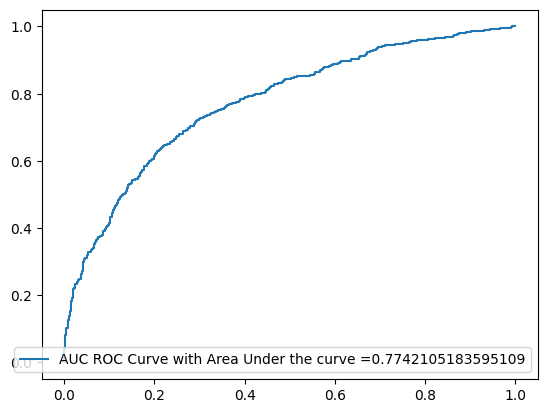

In [ ]:
from sklearn.metrics import roc_auc_score,roc_curve
y_pred_proba = model.predict_proba (X_test_ohe_outlier) [:, 1]
fpr, tpr, thresholds = roc_curve (y_test, y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="AUC ROC Curve with Area Under the curve ="+str(auc))
plt.legend (loc=4)
plt.show()

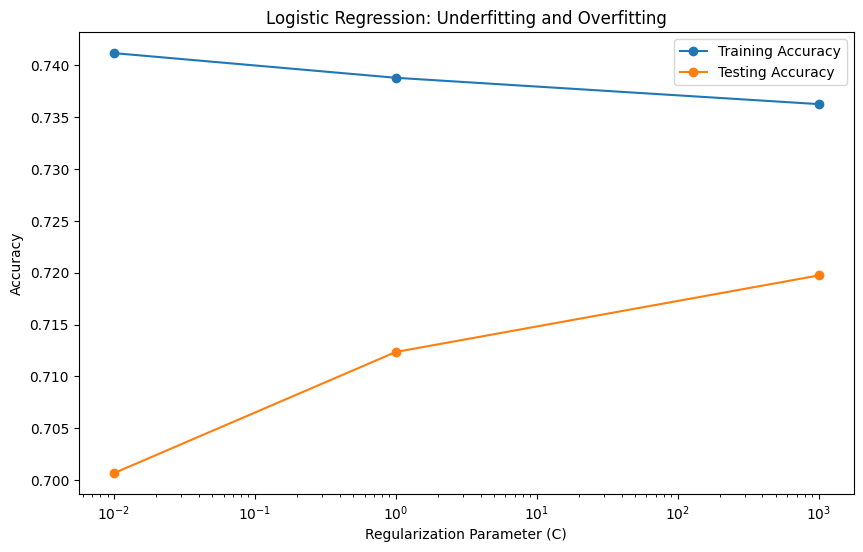

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

reg_params = [0.01, 1, 1000]
train_accuracy = []
test_accuracy = []

for C in reg_params:

    model = LogisticRegression(C=C, random_state=42,solver='liblinear', max_iter=1000)
    model.fit(X_train_ohe_outlier, y_train)

    # Predictions on training set
    y_train_pred = model.predict(X_train_ohe_outlier)
    train_accuracy.append(accuracy_score(y_train, y_train_pred))

    # Predictions on testing set
    y_test_pred = model.predict(X_test_ohe_outlier)
    test_accuracy.append(accuracy_score(y_test, y_test_pred))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(reg_params, train_accuracy, marker='o', label='Training Accuracy')
plt.plot(reg_params, test_accuracy, marker='o', label='Testing Accuracy')
plt.xscale('log')
plt.xlabel('Regularization Parameter (C)')
plt.ylabel('Accuracy')
plt.title('Logistic Regression: Underfitting and Overfitting')
plt.legend()
plt.show()

## We have training accuracy ~ 74%
## Test accuracy is improved from 70 to 72%

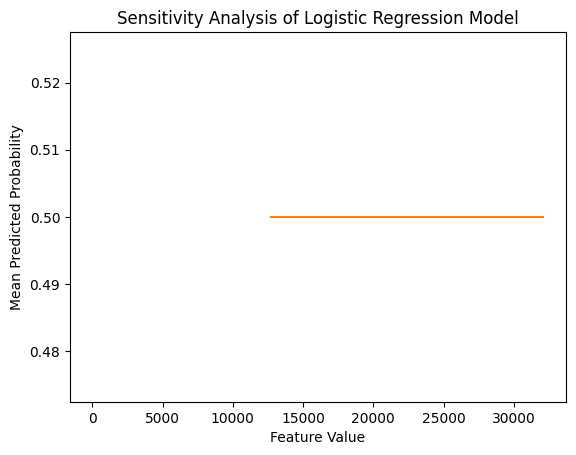

In [ ]:
# Sensitivity Analysis
features = ['Age','MonthlyIncome']
# features = X_test_ohe_outlier.columns.to_numpy()
for i, feature in enumerate(features):

    x_values = np.linspace(start=X_test_ohe_outlier[feature].min(), stop=X_test_ohe_outlier[feature].max(), num=100)
    y_values = []

    for x in x_values:
        X_temp = X_test_ohe_outlier.copy()
        X_temp[feature] = x  # Use column name for assignment
        y_temp = model.predict_proba(X_temp)[:,: ]
        y_values.append(y_temp.mean())

    plt.plot(x_values, y_values, label=f'Sensitivity of {feature}')

plt.xlabel('Feature Value')
plt.ylabel('Mean Predicted Probability')
#plt.legend()
plt.title('Sensitivity Analysis of Logistic Regression Model')
plt.show()

This graph show us the mean predicted probability of the target variable by changing features values monthly income and Age



<Axes: xlabel='MonthlyIncome', ylabel='DurationOfPitch'>

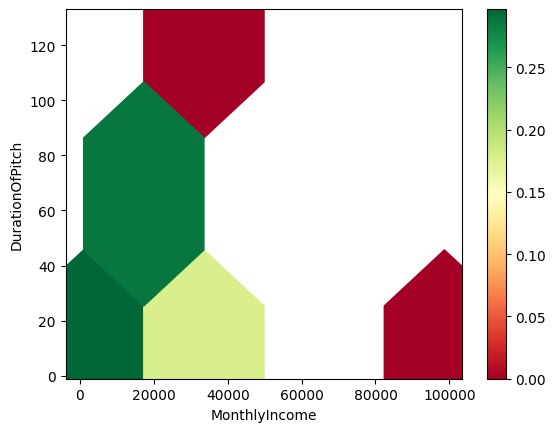

In [ ]:
df_tel.plot.hexbin(x='MonthlyIncome', y='DurationOfPitch', C='PlanTaken', gridsize=3, cmap='RdYlGn', sharex=False)

### The above graph shows how changing the values of  monthly income and duration of pitch impacts the values of target variable 'plantaken'

Support Vector Machine

In [ ]:
from sklearn.svm import LinearSVC, SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

LinSVC = LinearSVC()
LinSVC.fit(X_train_ohe_outlier, y_train)

Liblinear failed to converge, increase the number of iterations.


LinearSVC()

In [ ]:
SVCmodel = make_pipeline(StandardScaler(), SVC(C=1, kernel='rbf', tol=1e-5, verbose=False, max_iter=-1, decision_function_shape='ovr', probability=True, random_state=22))
SVCmodel.fit(X_train_ohe_outlier, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc',
                 SVC(C=1, probability=True, random_state=22, tol=1e-05))])

In [ ]:
from sklearn.metrics import accuracy_score
print("Kernel SVC train performance = ", accuracy_score(y_train,SVCmodel.predict(X_train_ohe_outlier)))
print("Kernel SVC test performance = ", accuracy_score(y_test,SVCmodel.predict(X_test_ohe_outlier)))

Kernel SVC train performance =  0.9190045966080203
Kernel SVC test performance =  0.8678549477566072


# Support Vector Machine Analysis
## Accuracy : Training : 91.90%
## Accuracy  Testing : 86.78%


#Conclusion

### 1.Following outlier removal and employing both under and oversampling techniques, our logistic regression model yields accuracies of 74% on the training set and 72% on the testing set.

### 2. Surprisingly, when employing the same preprocessed data, our support vector machine (SVM) model achieves a significantly higher accuracy of 86.78% on the testing set.

### 3.This observation leads us to the conclusion that SVM outperforms logistic regression in classification tasks, even after thorough performance tuning and hyperparameter optimization.

# Start with LIME and Shap

Applying lime to understand local importance of features

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_ohe_outlier.values, feature_names=X_train_ohe_outlier.columns, class_names=[0, 1], discretize_continuous=True)

In [ ]:
# Select a specific instance for explanation
instance_idx = 1
exp = explainer.explain_instance(X_test_ohe_outlier.loc[instance_idx].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('0.00 < iPhone <= 1.00', 0.2724098635413113),
 ('Occupation_Free Lancer <= 0.00', -0.2386849560902567),
 ('CityTier <= 1.00', -0.18449557749036707),
 ('PreferredServiceStar <= 3.00', -0.10525629296102776),
 ('Occupation_Large Business <= 0.00', -0.09605163444844074),
 ('PitchSatisfactionScore > 4.00', 0.07952199386488978),
 ('PlanPitched_Basic <= 0.00', -0.06349880309855624),
 ('Designation_Executive <= 0.00', -0.054191137566851635),
 ('MaritalStatus_Single > 0.00', 0.04736557819033452),
 ('MonthlyIncome > 24857.00', -0.041206778676670316)]

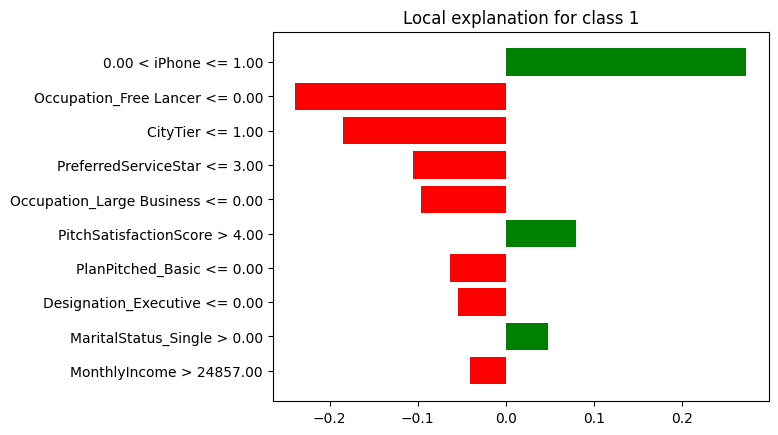

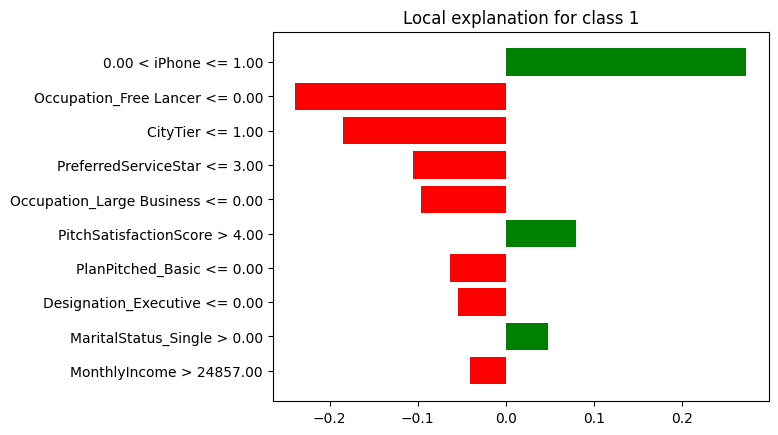

In [ ]:
exp.as_pyplot_figure()

Select 5th instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[5].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 0.
- 6 variables have negative influence on plan taken
- CityTier, Durationofpitch, designation and Age are impacting for the value 1 (opposite output)

Select 10th instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[10].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 1.
- 6 variables have negative influence on plan taken
- Preferredservicestar, MonthlyIncome, Planpitched are impacting for the value 0 (opposite output)

Select 15th instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[15].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 1.
- 6 variables have negative influence on plan taken
- cityTier, Numberoffollowups, Planpitched,Age,Desgination are impacting for the value 0 (opposite output)

Select 20th Instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[20].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 1.
- 6 variables have negative influence on plan taken
- iPhone, CityTier, Preferredservicestar ,pitchsatisfactionScore,Desgination are impacting for the value 0 (opposite output)

Select 25th instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[25].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 1.
- most of the variables have negative influence on plan taken
- only two features in favour of the output Occupation, pitchsatisfcationscore

Select 32nd instance

In [ ]:
exp = explainer.explain_instance(X_test_ohe_outlier.loc[32].values, SVCmodel.predict_proba)
# Visualize the explanation
# print("The column analysis of ",X_test_ohe_outlier.iloc[instance_idx])
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
exp.as_list()

[('iPhone <= 0.00', -0.2724279345494179),
 ('CityTier <= 1.00', -0.16457411869054853),
 ('Occupation_Large Business > 0.00', 0.10223372050746858),
 ('PreferredServiceStar <= 3.00', -0.09341134751109383),
 ('PitchSatisfactionScore <= 2.00', -0.09048758374659666),
 ('0.00 < Designation_Executive <= 1.00', 0.05771476689708695),
 ('MaritalStatus_Single > 0.00', 0.054770753453169035),
 ('MonthlyIncome > 24857.00', -0.05454495527515961),
 ('PlanPitched_Deluxe <= 0.00', 0.047241141521921305),
 ('Age > 42.00', -0.04429141405084839)]

- The predicted value is 1.
- most of the variables have negative influence on plan taken
- only two features in favour of the output Occupation, pitchsatisfcationscore

##Conclusion

- As per the 5 instances derived through monte carlo simulation we understood that planpitched, pitchsatisfactionscore,Designation are locally important features

# Shap

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 3.6 MB/s eta 0:00:00


In [ ]:
import shap
from sklearn.feature_extraction.text import TfidfVectorizer
shap.initjs()
explainer = shap.Explainer(
    LinSVC, X_train_ohe_outlier, feature_names= X_train_ohe_outlier.columns
)
shap_values = explainer(X_test_ohe_outlier)

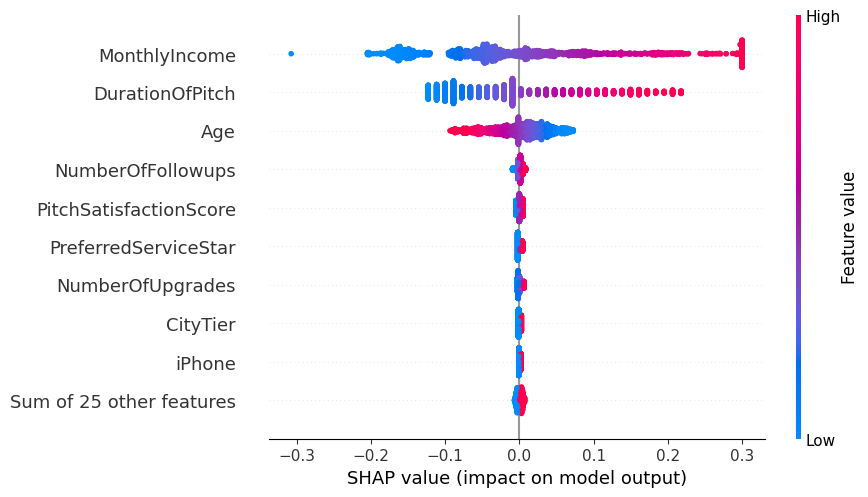

In [ ]:
shap.plots.beeswarm(shap_values)

- Monthly Income , Duration of pitch, Age -> Most important features (Globally)

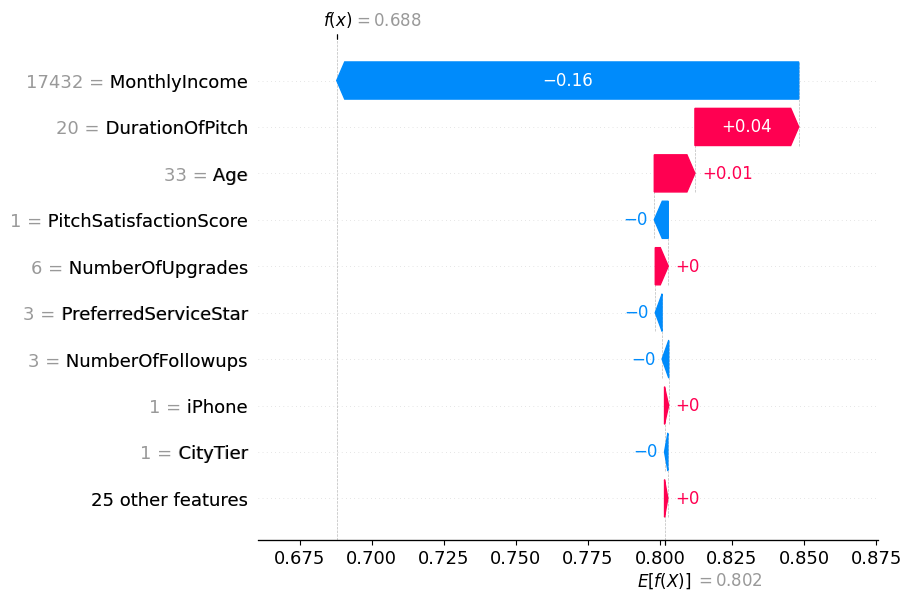

In [ ]:
shap.plots.waterfall(shap_values[0])

- For shap values record 0 Monthly income, Duration pitch has highest importance

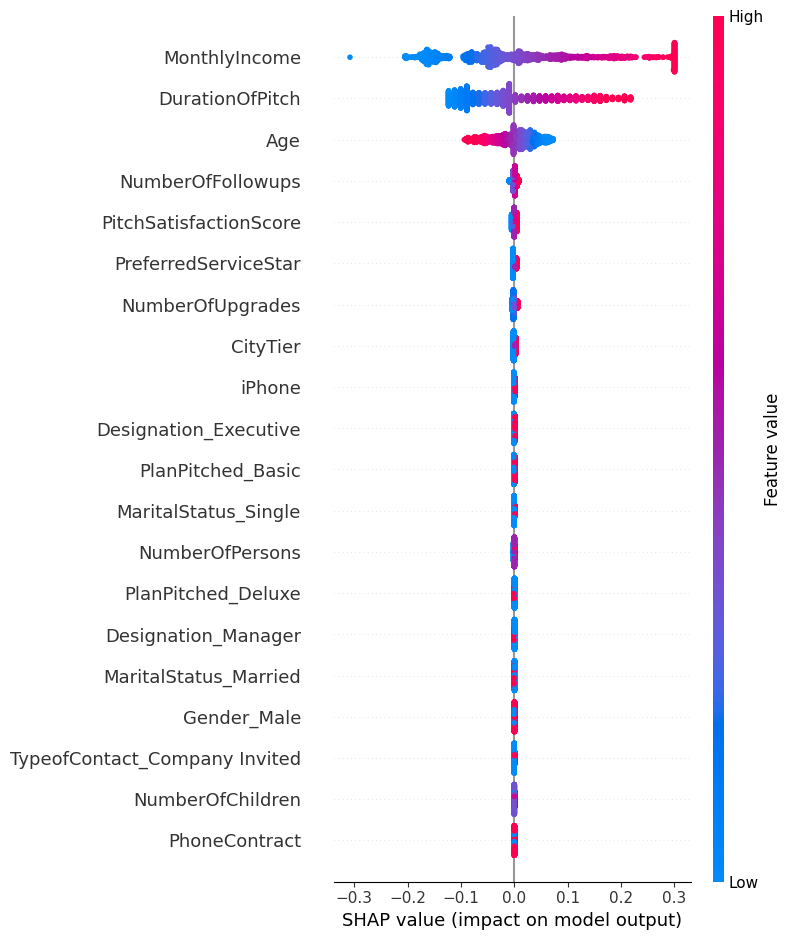

In [ ]:
shap.summary_plot(shap_values)

To summarize all the records we find similar pattern, Monthly income, Duration of pitch, Age have most global significance

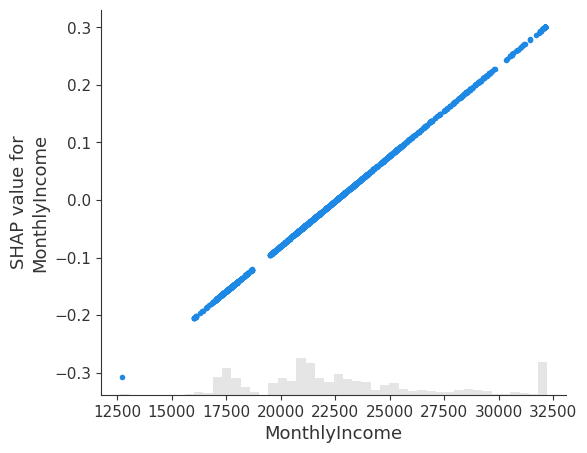

In [ ]:
shap.plots.scatter(shap_values[:, "MonthlyIncome"])

Shap value for Monthly income is constantly increasing

To summarize all the records we find similar pattern, Monthly income, Duration of pitch, Age have most global significance

# Trying with conf matrix

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate sensitivity (true positive rate)
sensitivity = conf_matrix[1, 1] / (conf_matrix[1, 0] + conf_matrix[1, 1])
print(f"Sensitivity (True Positive Rate): {sensitivity}")

Confusion Matrix:
[[615 215]
 [209 588]]
Sensitivity (True Positive Rate): 0.7377666248431619
